# Baseline approach

In this section, we'll try to provide a high-level and intuitive understanding
of how to estimate the tempo and beat from musical audio signals using
some of the more well-established signal processing techniques.
To keep things straightforward, we'll omit the estimation
of downbeats.

The content here is **not** intended to be very mathematical.
For a more detailed and precise definition of the tasks, we
highly recommend that you look at Chapter 6 and the 
corresponding python notebook from Meinard Müller's excellent: 
[Fundamentals of Music Processing Notebooks](https://www.audiolabs-erlangen.de/resources/MIR/FMP/C6/C6.html)

In this sense, we try to build a step-by-step baseline approach
and look at some of the assumptions, challenges, and limitations as we go.


## Time-frequency representation

While there are purely time-domain approaches to the estimation of the
beat from music signals (including one of, if not the most famous of all {cite}`scheirer98jasa`)
the vast majority of approaches depart from some time-frequency
representation of the audio input. 

So let's start here, by plotting the audio waveform and a
time-frequency representation. We'll work from the
mel spectrogram implementation in `librosa`


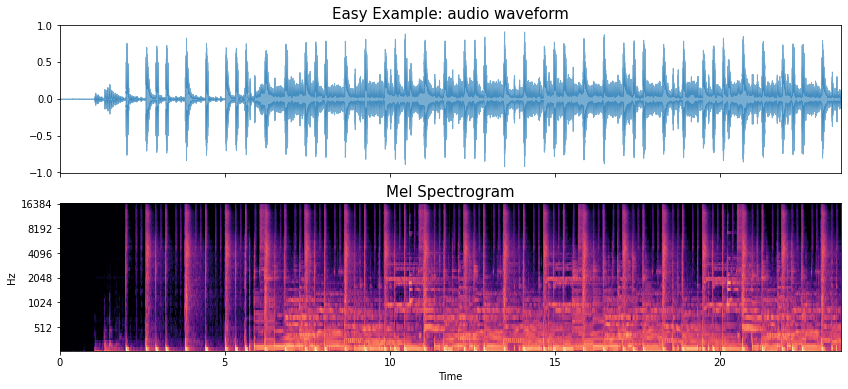

In [1]:
import warnings
warnings.simplefilter('ignore')
import numpy as np
import librosa
import librosa.display
import IPython.display as ipd
import mir_eval
import matplotlib.pyplot as plt
import scipy.stats


filename = '../assets/ch2_basics/audio/easy_example'

fps = 100
sr = 44100
n_fft = 2048
hop_length = int(librosa.time_to_samples(1./fps, sr=sr))
n_mels = 80
fmin = 27.5
fmax = 17000.
lag = 2
max_size = 3

# read audio and annotations
y, sr = librosa.load(filename+'.flac', sr = sr)
ref_beats = np.loadtxt(filename+'.beats')
ref_beats = ref_beats[:,0]

# make the mel spectrogram
S = librosa.feature.melspectrogram(y, sr=sr, n_fft=n_fft,
                                   hop_length=hop_length,
                                   fmin=fmin,
                                   fmax=fmax,
                                   n_mels=n_mels)


fig, ax = plt.subplots(nrows=2, sharex=True, figsize=(14,6))

librosa.display.waveplot(y, sr=sr, alpha=0.6, ax=ax[0])

ax[0].set_title('Easy Example: audio waveform', fontsize=15)
ax[0].label_outer()

librosa.display.specshow(librosa.power_to_db(S, ref=np.max),
                         y_axis='mel', x_axis='time', sr=sr,
                         hop_length=hop_length, fmin=fmin, fmax=fmax, ax=ax[1])

ax[1].set_title('Mel Spectrogram', fontsize=15)
ax[1].label_outer()

We know that the mel spectrogram has time on the horizontal axis 
and frequency (in mel bands) on the vertical axis. 

Very crudely we can look at "vertical" structure as corresponding
the percussive type content (e.g., drums) and "horizontal" structure
as corresponding to harmonic content (e.g., pitched musical instruments 
like bass, and keyboard).

In the code example above we've used a fairly arbitrary set of parameters
to generate the mel spectorgam, but we have a few ways to customise it if we want,
e.g., by changing:
* The range of frequencies from the lowest to highest
* The number of mel bands we choose to include

So, if we want to focus on the lower frequency part of the signal, 
we can limit the frequency range to 400Hz and use 40 mel bands over this range:

```{note}
If we want a lot of mel bands over a small frequency range like this, then
we also need to use a larger number of FFT bins.
```

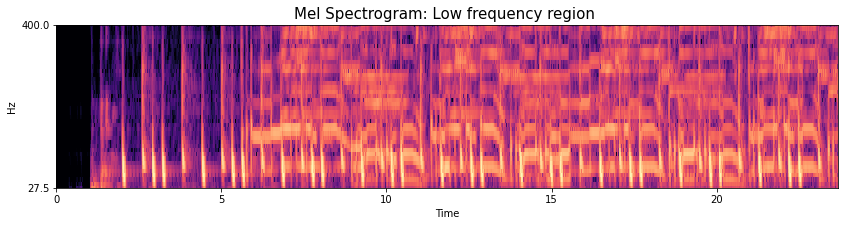

In [2]:
bl_fmax = 400
bl_nmels = 40
bl_n_fft = 4096
S_bl = librosa.feature.melspectrogram(y, sr=sr, n_fft=bl_n_fft,
                                   hop_length=hop_length,
                                   fmin=fmin,
                                   fmax=bl_fmax,
                                   n_mels=bl_nmels)

plt.figure(figsize=(14,3))
librosa.display.specshow(librosa.power_to_db(S_bl, ref=np.max),
                         y_axis='mel', x_axis='time', sr=sr,
                         hop_length=hop_length, fmin=fmin, fmax=bl_fmax)
plt.title('Mel Spectrogram: Low frequency region ', fontsize=15);



If we really squint over the first 5 seconds we can begin to 
pick apart which of the short vertical lines correspond
to the kick drum events and those corresponding to the snare drum events.
We can also listen again to this part for the drum pattern of:
kick, snare, kick-kick, snare over the first two bars. 
This easier to do if we zoom in over this region.


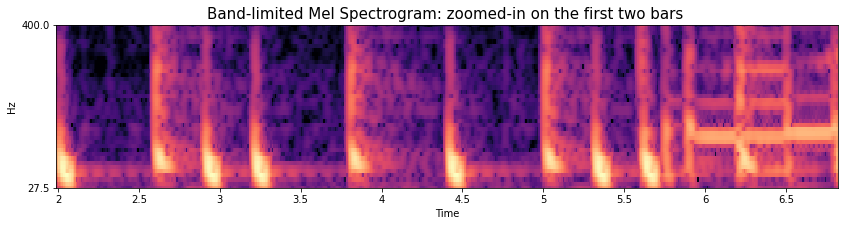

In [3]:
plt.figure(figsize=(14,3))
librosa.display.specshow(librosa.power_to_db(S_bl[:,:682], ref=np.max),
                         y_axis='mel', x_axis='time', sr=sr,
                         hop_length=hop_length, fmin=fmin, fmax=bl_fmax)
plt.title('Band-limited Mel Spectrogram: zoomed-in on the first two bars ', fontsize=15);
plt.xlim([1.99,6.82])
ipd.Audio(y[round(1.7*sr):round(6.82*sr)], rate=sr) 



```{note}
For this introductory part of the tutorial we're not going to make
direct use of this information, although the extremely
well-known approaches of Goto {cite}`goto01jnmr` and Klapuri et al {cite}`klapuri06taslp`
have exploited information about rhythmic patterns and drum events
to aid in the estimation of beat and downbeat structure. 

But, looking ahead to the later parts of the tutorial we may well expect
deep neural network approaches to be able to leverage this information,
albeit in a rather implicit fashion, by building models
based on observations in the mel spectrogram. 
```

## Mid-level representation

From this kind of time-frequency respresentation, the common next step
is to calculate a mid-level representation which can be used
as the basis for estimating the tempo and beat. 

While many options exist, perhaps the most prolific is the
spectral flux function, which we can interpet as a measure
of how much the mel spectrogram changes between pairs
of adjacent vertical slices, i.e., short periods in time.

Let's take a look at the spectral flux function for the
initial wide-band mel spectrogram, and then contrast
this with the band-limited low frequency version.


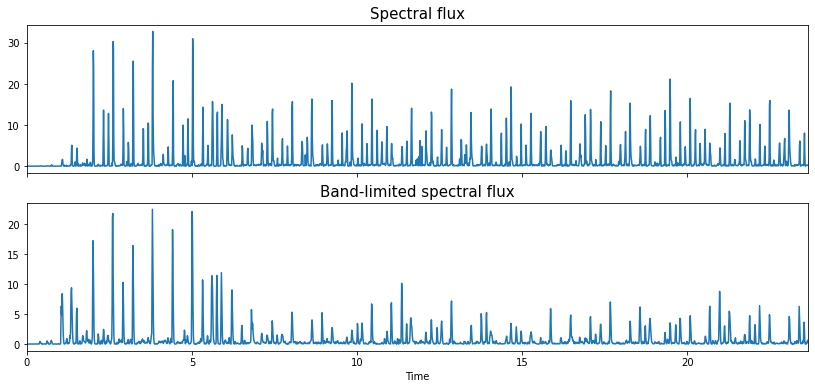

In [4]:
spectral_flux = librosa.onset.onset_strength(S=librosa.power_to_db(S, ref=np.max),
                                      sr=sr,
                                      hop_length=hop_length,
                                      lag=lag, max_size=max_size)


bl_spectral_flux = librosa.onset.onset_strength(S=librosa.power_to_db(S_bl, ref=np.max),
                                      sr=sr,
                                      hop_length=hop_length,
                                      lag=lag, max_size=max_size)


frame_time = librosa.frames_to_time(np.arange(len(spectral_flux)),
                                    sr=sr,
                                    hop_length=hop_length)

fig, ax = plt.subplots(nrows=2, sharex=True, figsize=(14,6))

ax[0].plot(frame_time, spectral_flux, label='Spectral flux')
ax[0].set_title('Spectral flux', fontsize=15)

ax[1].plot(frame_time, bl_spectral_flux, label='Band-limited spectral flux')
ax[1].set_title('Band-limited spectral flux', fontsize=15)
ax[1].set(xlabel='Time')
ax[1].set(xlim=[0, len(y)/sr]);
ax[0].label_outer()

We can see they're different, with a lot more peaks in the wide-band version than the band-limited.

Let's zoom in and look at the first two bars again.

Here we see that almost all of the peaks that would correspond to hi-hat events have been surpressed.

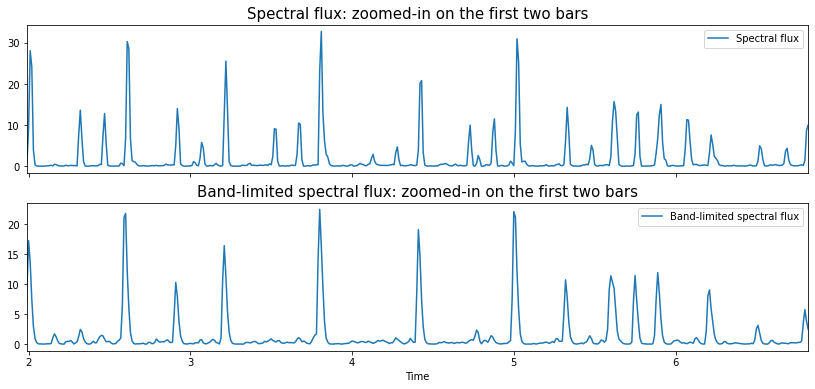

In [5]:
fig, ax = plt.subplots(nrows=2, sharex=True, figsize=(14,6))
frame_time = librosa.frames_to_time(np.arange(len(spectral_flux)),
                                    sr=sr,
                                    hop_length=hop_length)

ax[0].plot(frame_time, spectral_flux, label='Spectral flux')
ax[0].legend()
ax[0].set_title('Spectral flux: zoomed-in on the first two bars', fontsize=15)

ax[1].plot(frame_time, bl_spectral_flux, label='Band-limited spectral flux')
ax[1].legend()
ax[1].set_title('Band-limited spectral flux: zoomed-in on the first two bars', fontsize=15)
ax[1].set(xlabel='Time')

ax[1].set(xlim=[1.99, 6.82]);
ipd.Audio(y[round(1.7*sr):round(6.82*sr)], rate=sr) 

Now, this isn't intended to be a tutorial about automatic drum transcription! but it can be
useful to think about our basic understanding of the drum pattern of the two bar intro
and use this to get some inuition about the tempo and beat structure of the piece.

```{note}
There isn't anything in this spectral flux function to tell us which drum event is which,
we can only make this assessment by listening and following along with spectral flux function.
All we have is a measurement of spectral change, with higher peaks indicative of 
more short-term change in the spectrogram. If we really want to see drum-sound
specific mid-level representations (or activation functions) we could 
look to automatic drum transcription tools such as [ADT](https://github.com/CarlSouthall/ADTLib). 
````

For what it's worth, we don't need to rely on the presence of drums in musical recordings
to find the tempo and beats, but we typically get sharper peaks in spectral flux type
representations when there are at least "percussive" onsets. 

If we try to think heuristically about the relationship between the beats and the
spectral flux function, then, for simple cases, we're going to try to look 
for a set of strong, roughly periodic peaks and associate these with the beats.

Before moving on, it's useful to remember an important aspect of the relationship between beats and onsets.
* Not every onset is beat
* But also, not every beat needs to have an onset

## Periodicity detection

```{admonition} Full disclosure!

The example code for tempo estimaton and plotting in librosa is so nice, that we've used
in almost verbatim here. So a big shout out to Brian McFee!
````

The goal of periodicity detection is essentially to discover the tempo of the piece
of music. As we've seen and heard in the definitions by sound example section,
this tempo can be largely constant (in the case of the easy and Candombe examples)
or highly variable as in the expressive example. 

When we talk about a periodicity we're talking about a measurement in time,
essentially: what is the time between consecutive beats. By contrast,
when we talk about tempo, this is a rate, (something like 1/time) 
and thus is a measurement of the number of beats that occur over a specific
time period. Most commonly, we talk about the number of **beats per minute** (BPM)
but we could just as well talk about **beats per second** (BPS) and take this measurement in Hz.
In any case, whether we're measuring time in seconds, or the number of frames
in a mel spectrogram, and whether we want tempo in BPM or BPS, it's very
straightforward to move between them both in terms of single values
and signals which are calculated over a range of lags or tempi. 

One of the most well-used techniques for the estimating the beat periodicity
in music signals is the **autocorrelation function**. In a high-level way,
we obtain the autocorrelation function by taking a copy of the signal in question 
and sliding one across the other. We can then look for the time-delays (or lags) 
where the original signal and shifted version are similar, and this creates
peaks in the autocorrelation function for us to interpret.

For the estimation of fundamental frequency, say for musical notes or speech, 
it's possible to calculate the autocorrelation function directly on the samples of the waveform,
but we already have a nice intermediate, mid-level representation that we can use:
the spectral flux function. 

Let's take a look at the plots below the code
block and try to interpret them!


In [6]:
# let's make a helper function for plotting

def periodicity_estimation_plots(oenv, sr, hop_length, ref_beats=None):
    tempogram = librosa.feature.tempogram(onset_envelope=oenv, sr=sr,
                                          hop_length=hop_length)
    # Compute global onset autocorrelation
    ac_global = librosa.autocorrelate(oenv, max_size=tempogram.shape[0])
    ac_global = librosa.util.normalize(ac_global)
    tempo = librosa.beat.tempo(onset_envelope=oenv, sr=sr,
                               hop_length=hop_length)[0]


    fig, ax = plt.subplots(nrows=4, figsize=(14, 14))
    times = librosa.times_like(oenv, sr=sr, hop_length=hop_length)
    ax[0].plot(times, oenv)
    ax[0].set_title('Spectral flux',fontsize=15)
    ax[0].label_outer()
    ax[0].set(xlim=[0, len(oenv)/fps]);
    librosa.display.specshow(tempogram, sr=sr, hop_length=hop_length,
                             x_axis='time', y_axis='tempo', cmap='magma',
                             ax=ax[1])
    ax[1].axhline(tempo, color='w', linestyle='--', alpha=1,
                label='Estimated tempo={:g}'.format(tempo))
    ax[1].legend(loc='upper right')
    ax[1].set_title('Tempogram',fontsize=15)
    x = np.linspace(0, tempogram.shape[0] * float(hop_length) / sr,
                    num=tempogram.shape[0])
    ax[2].plot(x, np.mean(tempogram, axis=1), label='Mean local autocorrelation')
    ax[2].plot(x, ac_global, '--', alpha=0.75, label='Global autocorrelation')
    ax[2].set(xlabel='Lag (seconds)')
    ax[2].legend(frameon=True)
    freqs = librosa.tempo_frequencies(tempogram.shape[0], hop_length=hop_length, sr=sr)
    ax[3].semilogx(freqs[1:], np.mean(tempogram[1:], axis=1),
                 label='Mean local autocorrelation', basex=2)
    ax[3].semilogx(freqs[1:], ac_global[1:], '--', alpha=0.75,
                 label='Global autocorrelation', basex=2)
    ax[3].axvline(tempo, color='black', linestyle='--', alpha=.8,
                label='Estimated tempo={:g}'.format(tempo))
    
    if ref_beats is not None:
        gt_tempo = 60./np.median(np.diff(ref_beats))
        ax[3].axvline(gt_tempo, color='red', linestyle='--', alpha=.8,
                label='Tempo derived from beat annotations={:g}'.format(gt_tempo))

    ax[3].legend(frameon=True)
    ax[3].legend(loc='upper right')
    ax[3].set(xlabel='BPM')
    ax[3].grid(True)
    return tempo

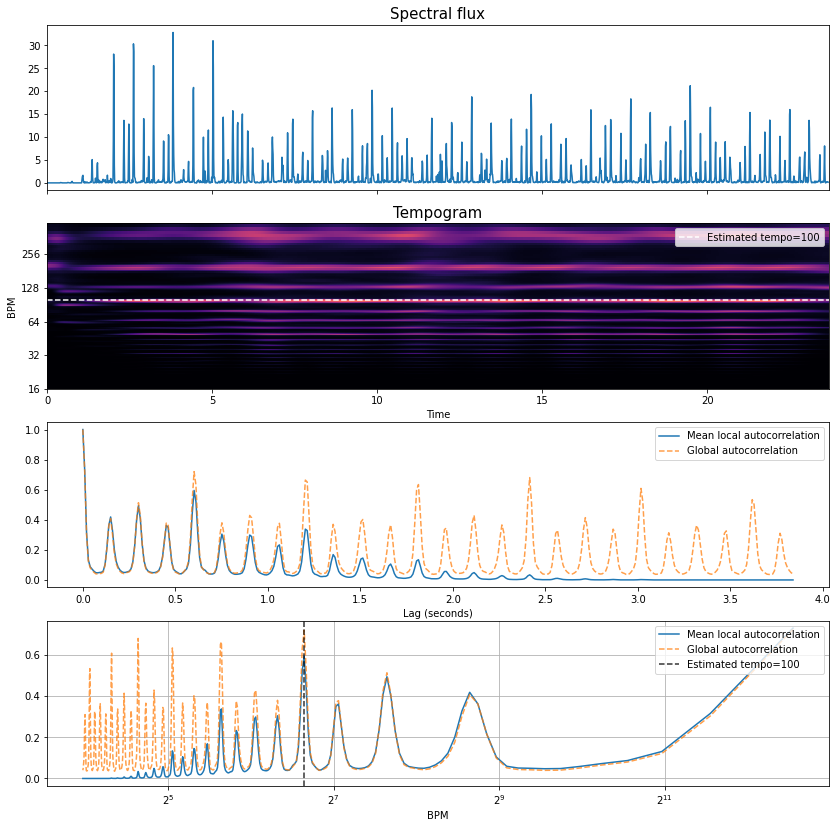

In [7]:
tempo = periodicity_estimation_plots(oenv=spectral_flux, sr=sr, hop_length=hop_length)

To start with, let's compare the spectral flux function in the first plot
and the orange dashed global autocorrelation function the third plot.

* We can see lots of regularly spaced peaks with some stronger than others.
* **Note** these are not the beats! but rather the lags (or shifts) at which the spectral flux lines up well 
against itself
* If we look at the x-axis we can that we're measuring lags up to approximatey 4 seconds.
* The lag of one of these peaks is going to coincide with the tempo of the excerpt, the question is which one?
* If we think about what comfortable tapping rates might, then this can guide us as to which peaks are more 
likely to correspond to the tempo than others.
* For example, the first peak is around 0.15s, which would correspond to 400 BPM and for all but the most 
talented percussists and drummers, this would would be very hard to tap consistently.
* Constrasting this with the lag of the last peak is around 3.75s, this corresponds to a tempo of 16 BPM, and 
is below the lower tempo limit at which we can tap a steady beat (around 30 BPM {cite}`london04hearing`). 
* Thus, we need to look somewhere in between.
* What can help us, and what `librosa` uses is a prior distribution over likely tempi.
* If we contrast the dotted orange line in the fourth plot, we can see the same autocorrelation funciton 
but now it has been mapped to a tempo rather than a lag scale. 
* We can apply this prior distribution as a kind of approximate perceptual weighting over tempi, and then 
recover an estimated tempo of 100 BPM (the lag around 0.6 seconds in the third plot), which corresponds
very well with the tempo as estimated by the median inter-beat-interval of the annotations.

But what about the blue lines in the third and fourth plots, and the tempogram in the second plot?
* So far, we've just looked at the global autocorrelation function, but much like
the mel spectrogram is split up into frames of short duration, we can use a similar
idea to generate a kind of time-periodicity representation (as opposed to a time-frequency representation)
by calculating the autocorrelation over short windowed regions of the spectral flux (e.g., in order of several seconds each).
* If we map the lag scale into tempo (like moving from the third to the fourth plot), then we can observe
the kind of "tempo frequencies" which are present in the input, and if these vary through time. 
* As we can see in this excerpt, there is very little variation, confirming through visual inspection that the 
tempo is constant.
* Finally, concerning the blue lines in the third and fourth plots, these simply correspond to the temopral
average over these short duration windows, and as such they "taper" off at higher periodicity (lower tempi) due to the lack of overlap between the shifted versions of the windowed spectral flux. 


In order to take a look at a case with a variable tempo, 
we can repeat the process with the expressive example and take a look at the same plots.

Let's first remind ourselves of how it sounds, together the clicks
to mark the beats and downbeats.

In [8]:
filename_exp = '../assets/ch2_basics/audio/expressive_example'

# read audio and annotations
y_exp, sr = librosa.load(filename_exp+'.flac', sr = sr)
ref_beats_exp = np.loadtxt(filename_exp+'.beats')
ref_downbeats_exp = ref_beats_exp[ref_beats_exp[:, 1] == 1][:, 0]

ref_beats_exp = ref_beats_exp[:,0]

y_beats_exp = librosa.clicks(times=ref_beats_exp, sr=sr, click_freq=1000.0, 
                             click_duration=0.1, length=len(y_exp))
y_downbeats_exp = librosa.clicks(times=ref_downbeats_exp, sr=sr, click_freq=1500.0, 
                                 click_duration=0.15,length=len(y_exp))

ipd.Audio(0.6*y_exp+0.25*y_beats_exp+0.25*y_downbeats_exp, rate=sr) 

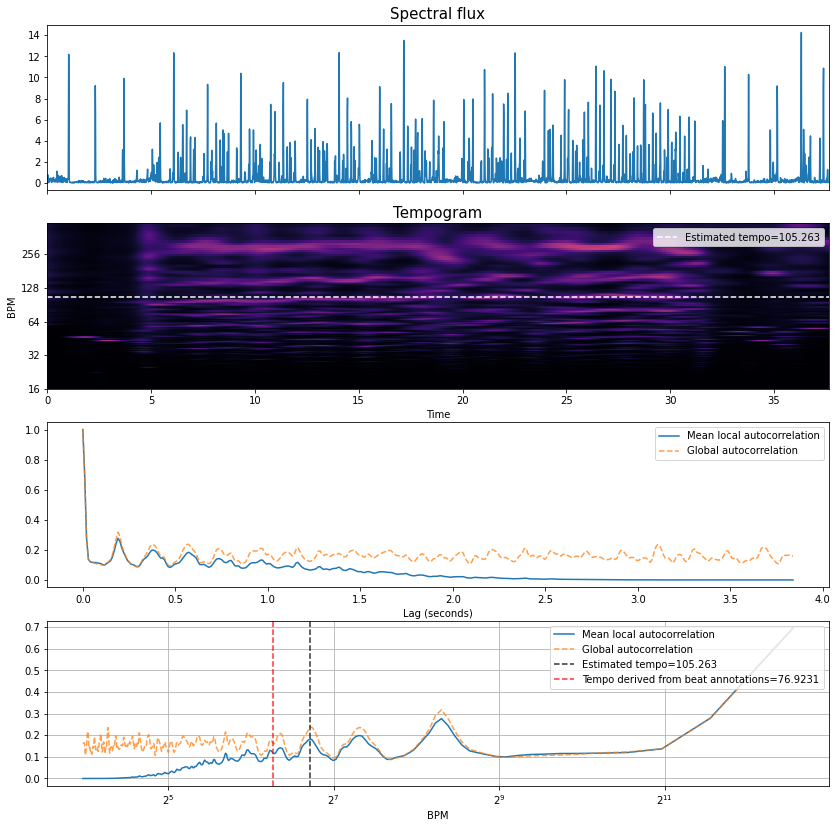

In [9]:

fps = 100
sr = 44100
n_fft = 2048
hop_length = int(librosa.time_to_samples(1./fps, sr=sr))
n_mels = 80
fmin = 27.5
fmax = 17000.
lag = 2
max_size = 3

# make the mel spectrogram
S_exp = librosa.feature.melspectrogram(y_exp, sr=sr, n_fft=n_fft,
                                   hop_length=hop_length,
                                   fmin=fmin,
                                   fmax=fmax,
                                   n_mels=n_mels)
spectral_flux_exp = librosa.onset.onset_strength(S=librosa.power_to_db(S_exp, ref=np.max),
                                      sr=sr,
                                      hop_length=hop_length,
                                      lag=lag, max_size=max_size)

tempo_exp = periodicity_estimation_plots(oenv=spectral_flux_exp, sr=sr, 
                                         hop_length=hop_length, ref_beats = ref_beats_exp);



By inspection, we can that:
* There are far fewer peaks in the autocorrelation function, meaning the spectral flux function doesn't line up well against itself over many lags. But, we should expect that for a variable tempo piece. 
* The tempogram representation now has kind of "wavy" lines rather than straight ones, and the overlaid
"global" tempo estimate only partially lines up. 
* That said, the tempo of the piece (as determined by the median inter beat interval of the annotations) is approximately 77 BPM, and thus the estimated tempo is not correct.
* However, in this variable tempo context, it's not super meaningful to reduce the tempo information down to a single value.

## Recovering Beats

Once we've made an estimate of the tempo, the next stage is to 
attempt to recover the the final sequence of beats, i.e., their
temporal locations. For this, we'll return to the spectral
flux function again of the easy example and proceed from there. 

The basis of the phase estimation will be the classical dynamic programming 
approach from {cite}`ellis07jnmr`.
Once, again, we'll borrow heavily from the excellent code examples in `librosa`, 
but in order to generate some intermediate
visualisations we've exposed the main dynamic programming function
here, and also modified it slightly
to allow a little additional experimentation.

```{note}
For a complementary and notation-rigourous description of the dynamic
programming approach to beat tracking, we highly recommend looking
into section [6.3.2](https://www.audiolabs-erlangen.de/resources/MIR/FMP/C6/C6S3_BeatTracking.html)
of Meinard Müller's: [Fundamentals of Music Processing Notebooks](https://www.audiolabs-erlangen.de/fau/professor/mueller/notebookFMP).
```

For those curious, you can dig into the code below, else we can skip over
to the plots and take a look at the output and try to explain what's going on.

In [10]:
def beat_track_dp(oenv, tempo, fps, sr, hop_length, tightness=100, alpha=0.5, ref_beats=None):

    period = (fps * 60./tempo)
    localscore = librosa.beat.__beat_local_score(oenv, period)
    
    backlink = np.zeros_like(localscore, dtype=int)
    cumulative_score = np.zeros_like(localscore)

    # Search range for previous beat
    window = np.arange(-2 * period, -np.round(period / 2) + 1, dtype=int)

    txwt = -tightness * (np.log(-window / period) ** 2)

    # Are we on the first beat?
    first_beat = True
    for i, score_i in enumerate(localscore):

        # Are we reaching back before time 0?
        z_pad = np.maximum(0, min(-window[0], len(window)))

        # Search over all possible predecessors
        candidates = txwt.copy()
        candidates[z_pad:] = candidates[z_pad:] + cumulative_score[window[z_pad:]]

        # Find the best preceding beat
        beat_location = np.argmax(candidates)

        # Add the local score
        cumulative_score[i] = (1-alpha)*score_i + alpha*candidates[beat_location]

        # Special case the first onset.  Stop if the localscore is small
        if first_beat and score_i < 0.01 * localscore.max():
            backlink[i] = -1
        else:
            backlink[i] = window[beat_location]
            first_beat = False

        # Update the time range
        window = window + 1

    beats = [librosa.beat.__last_beat(cumulative_score)]

    # Reconstruct the beat path from backlinks
    while backlink[beats[-1]] >= 0:
        beats.append(backlink[beats[-1]])

    # Put the beats in ascending order
    # Convert into an array of frame numbers
    beats = np.array(beats[::-1], dtype=int)

    # Discard spurious trailing beats
    beats = librosa.beat.__trim_beats(oenv, beats, trim=True)
    
    # Convert beat times seconds
    beats = librosa.frames_to_time(beats, hop_length=hop_length, sr=sr)
    
    return beats, cumulative_score

# again we'll make a little helper function for plotting,
# we can pass the annotate beats (ref_beats) just for plotting purposes
def dp_and_plot(oenv, tempo, fps, sr, hop_length, tightness, alpha, ref_beats=None):
    
    est_beats, cumulative_score = beat_track_dp(oenv, tempo, fps, 
                                                sr, hop_length, tightness, alpha, ref_beats)
    fig, ax = plt.subplots(nrows=2, figsize=(14, 6))
    times = librosa.times_like(oenv, sr=sr, hop_length=hop_length)
    ax[0].plot(times, oenv, label='Spectral flux')
    ax[0].set_title('Spectral flux',fontsize=15)
    ax[0].label_outer()
    if ref_beats is not None:
        ax[0].vlines(ref_beats, 0, 1.1*oenv.max(), label='Annotated Beats', 
                     color='r', linestyle=':', linewidth=2)

    ax[0].set(xlim=[0, len(oenv)/fps]);
    ax[0].legend(loc='upper right')

    ax[1].plot(times, cumulative_score, color='orange', label='Cumultative score')
    ax[1].set_title('Cumulative score (alpha:'+str(alpha)+')',fontsize=15)
    ax[1].label_outer()
    ax[1].set(xlim=[0, len(oenv)/fps]);
    ax[1].vlines(est_beats, 0, 1.1*cumulative_score.max(), label='Estimated beats', 
                 color='green', linestyle=':', linewidth=2)
    ax[1].legend(loc='upper right');
    ax[1].set(xlabel = 'Time');
    
    return est_beats

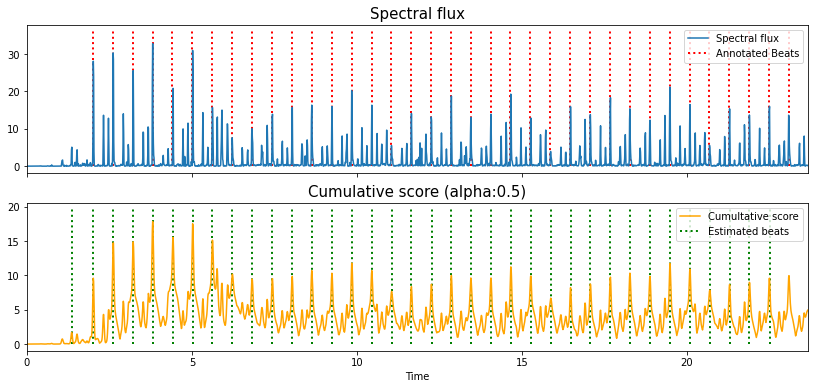

In [11]:
dp_and_plot(oenv=spectral_flux, tempo=tempo, fps=fps, sr=sr,hop_length=hop_length, tightness=100, alpha=0.5, ref_beats = ref_beats);

* In the top plot we have the spectral flux function and the annotated beat positions 
(without downbeat markers).
* In the bottom plot we have an intermediate function called the "cumulative score" which is generated 
internally by the dynamic programming function, together with the estimated beat positions. 
* This cumulative score is generated by a recursive calculation which, for each point in the spectral flux, 
looks back over itself across two beat periods, applies a penalty function (for which the penalty is lowest at exactly one beat in the past) and finds records the 
maximum value and its index, the latter of which is stored in a "backlink".
    * The value of the exposed "tightness" parameter sets how narrow this weighting is, and for high values favours constant tempi.
* The cumulative score at this point, is then updated as a weighted sum between itself and the value of the spectral flux at that point. 
    * Here the "alpha" parameter (set to 0.5 in the standard `librosa` implementation) can be understood as how reactive the cumulative score is to timing changes. A high value can be understood as a kind of internal momentum of a fixed tempo, almost a kind of "interia", whereas a lower value might help in tracking expressive timing changes.
* While the bottom plot could give the impression that the beat estimates are recovered by finding the peaks of the cumulative score, **this is not the case**. 
* An initial starting point, a local maximum near the end of the cumulative score is found, and then the corresponding point in the backlink indicates where the beat immediately before should occur.
* We then find the value of the backlink at this new earlier beat, and repeat until we've worked out way right back to the start of the excerpt.

**So, why did we plot the cumulative score?**
* Because it can be a useful means to understand the inertia of the dynamic programming model. 
* If we increase the value of alpha close to 1, we can see how the cumulative score can re-enforce the notion of a constant tempo in the piece.
    * This is a property which may be extremely useful when we need the beat tracker to kind of "push" it's way through regions of high syncopation or at points where there isn't a strongly induced beat.

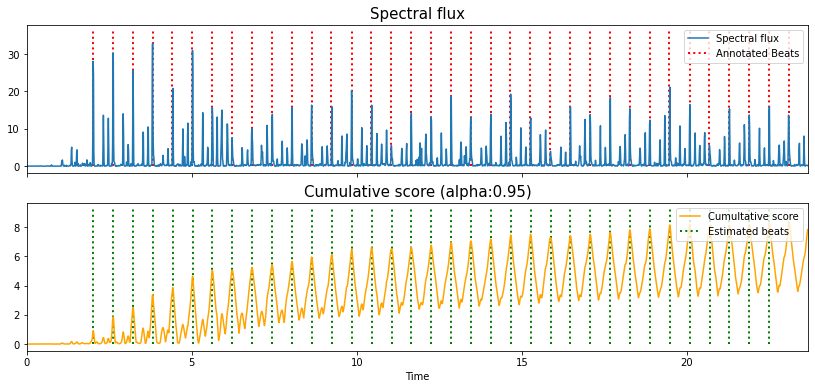

In [12]:
est_beats_095 = dp_and_plot(oenv=spectral_flux, tempo=tempo, fps=fps, sr=sr,hop_length=hop_length, tightness=100, alpha=0.95, ref_beats=ref_beats);


Let's listen back to those beats and hear about they sound.

In [13]:
y_beats = librosa.clicks(times=est_beats_095, sr=sr, click_freq=1000.0, click_duration=0.1, length=len(y))

ipd.Audio(0.6*y+0.25*y_beats, rate=sr) 

Let's also listen to one other sound example which demonstrates this principle quite nicely. 

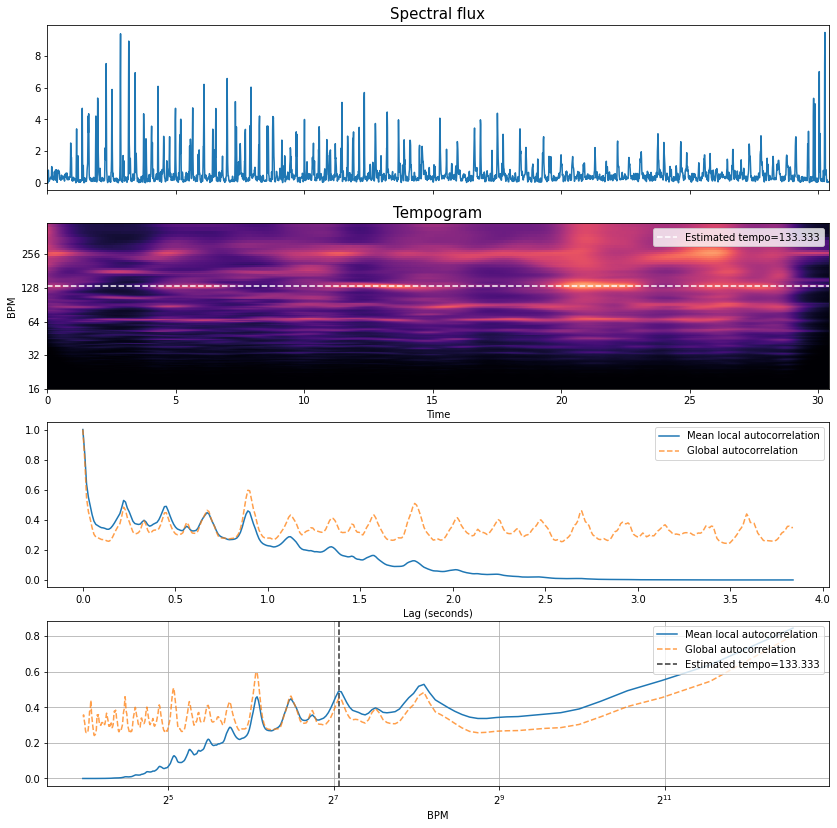

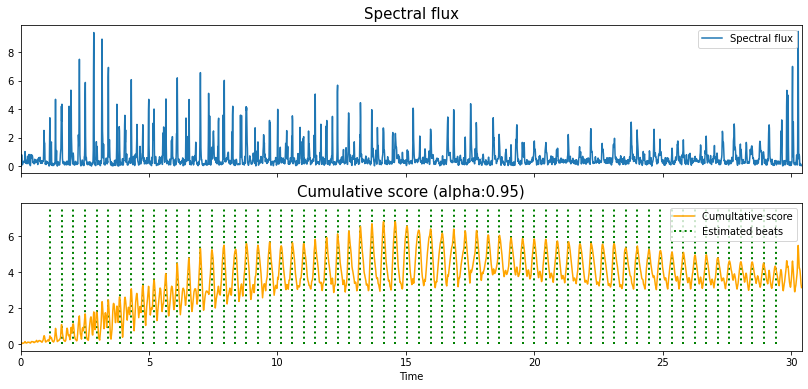

In [14]:
filename_exp = '../assets/ch2_basics/audio/mini'

# read audio and annotations
y_mini, sr = librosa.load(filename_exp+'.flac', sr = sr)

fps = 100
sr = 44100
n_fft = 2048
hop_length = int(librosa.time_to_samples(1./fps, sr=sr))
n_mels = 80
fmin = 27.5
fmax = 17000.
lag = 2
max_size = 3

# make the mel spectrogram
S_mini = librosa.feature.melspectrogram(y_mini, sr=sr, n_fft=n_fft,
                                   hop_length=hop_length,
                                   fmin=fmin,
                                   fmax=fmax,
                                   n_mels=n_mels)
spectral_flux_mini = librosa.onset.onset_strength(S=librosa.power_to_db(S_mini, ref=np.max),
                                      sr=sr,
                                      hop_length=hop_length,
                                      lag=lag, max_size=max_size)

tempo_mini = periodicity_estimation_plots(oenv=spectral_flux_mini, 
                                          sr=sr, hop_length=hop_length)


est_beats_mini = dp_and_plot(oenv=spectral_flux_mini, tempo=tempo_mini, 
                             fps=fps, sr=sr,hop_length=hop_length, 
                             tightness=100, alpha=0.95);

ipd.Audio(y_mini, rate=sr) 



In [15]:
y_beats_mini = librosa.clicks(times=est_beats_mini, sr=sr, click_freq=1000.0, 
                              click_duration=0.1, length=len(y_mini))

ipd.Audio(0.6*y_mini+0.25*y_beats_mini, rate=sr) 

## Summary

In this section, we've taken a high-level look at how to estimate the tempo
and beats from music signals using classical signal processings tools like 
autocorrelation and dynamic programming. 

As we move forward into the later parts of the tutorial we can 
see how the problems can be formulated in a different
way when we move into the use of deep learning.

But for now, we move on to the last part of the introductory
material which considers how to evaluate... or put another way,
how can we measure if the outputs we just heard are any good.